In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt


## S&P 500 Sector Index

In [2]:
sp500 = pd.read_csv('/Users/msstark/Desktop/Brandeis/Field Project/code/spReturn.csv').drop('Unnamed: 0',axis = 1)
sp500.head()

,Date,Materials_ret,_Industrials_ret,_Consumer_Discretionary_ret,Consumer_Staples_ret,_Health_Care_ret,Financials_ret,Information_Technology_ret,Telecommunication_Services__ret,Utilities_ret,Real_Estate_ret,Energy_ret
0,1995-02-01,0.064244,0.052688,0.033880,0.028613,0.011563,0.052696,0.066760,0.005734,0.000942,-0.011090,0.031235
1,1995-03-01,0.053224,0.033088,0.030175,0.028865,0.027695,0.001254,0.050385,0.002281,-0.022580,-0.006164,0.050957
2,1995-04-01,0.012541,0.030675,-0.013433,0.028333,0.024959,0.033539,0.105226,0.021426,0.027722,0.036709,0.027098
3,1995-05-01,0.029633,0.021884,0.044629,0.043040,0.022940,0.074939,0.037986,-0.007054,0.065561,0.014088,0.029913
4,1995-06-01,0.036621,0.015762,0.026340,0.016143,0.041401,0.003703,0.090244,0.027482,-0.015030,0.007169,-0.036326


In [4]:
sp500.shape

(328, 12)

In [59]:
#spSector.to_csv('spReturn.csv')

## Bloomberg Commodity Index

In [5]:
bcom = pd.read_csv('/Users/msstark/Desktop/Brandeis/Field Project/data/BCOM_ret.csv').drop('Unnamed: 0',axis = 1)
#set index in order to map the date according to SP500 data
bcom.set_index('Date',inplace = True)
bcom.head()

,Price,bcom_lag,bcom_ret,bcom_var
Date,,,,
1994-06-30,96.048,93.724,0.024796,0.000520
1994-07-31,97.018,96.048,0.010099,0.000066
1994-08-31,94.062,97.018,-0.030469,0.001053
1994-09-30,93.842,94.062,-0.002339,0.000019
1994-10-31,94.202,93.842,0.003836,0.000003


In [7]:
# select the data used for forecast, lag one month to avoid looking forward bias
bcom_select = bcom[(bcom.index > '1994-12-25') & (bcom.index < '2022-04-01')].copy()
bcom_select.reset_index(inplace = True)
bcom_select.head()

,Date,Price,bcom_lag,bcom_ret,bcom_var
0,1994-12-31,95.772,93.584,0.023380,0.000458
1,1995-01-31,94.740,95.772,-0.010776,0.000163
2,1995-02-28,94.190,94.740,-0.005805,0.000061
3,1995-03-31,96.044,94.190,0.019684,0.000313
4,1995-04-30,97.531,96.044,0.015482,0.000182


In [8]:
bcom_select.shape

(328, 5)

In [69]:
#bcom_select.to_csv('bcomSelect.csv')

### CPI

In [9]:
cpi = pd.read_csv('/Users/msstark/Desktop/Brandeis/Field Project/data/CPI_return.csv').drop('Unnamed: 0',axis = 1)
cpi.set_index('Date',inplace = True)
cpi.head()

,CPI_INDX,cpi_lag,cpi_ret,cpi_var
Date,,,,
1994-06-30,147.9,147.5,0.002712,4.601271e-07
1994-07-31,148.4,147.9,0.003381,1.814745e-06
1994-08-31,149.0,148.4,0.004043,4.038448e-06
1994-09-30,149.3,149.0,0.002013,4.046102e-10
1994-10-31,149.4,149.3,0.000670,1.859801e-06


In [11]:
# lag one time
cpi_select = cpi[(cpi.index > '1994-11-25') & (cpi.index < '2022-03-01')].copy()
cpi_select.reset_index(inplace = True)
cpi_select.head()

,Date,CPI_INDX,cpi_lag,cpi_ret,cpi_var
0,1994-11-30,149.8,149.4,0.002677,4.145279e-07
1,1994-12-31,150.1,149.8,0.002003,9.528036e-10
2,1995-01-31,150.5,150.1,0.002665,3.986058e-07
3,1995-02-28,150.9,150.5,0.002658,3.897125e-07
4,1995-03-31,151.2,150.9,0.001988,2.067173e-09


In [12]:
cpi_select.shape

(328, 5)

In [73]:
#cpi_select.to_csv('cpiSelect.csv')

### PMI

In [13]:
#pmi = pd.read_csv('/Users/msstark/Desktop/Brandeis/Field Project/data/PMI_return.csv').drop('Unnamed: 0',axis = 1)
pmi = pd.read_csv('/Users/msstark/Desktop/Brandeis/Field Project/code/pmi2_ret.csv')
pmi.set_index('Date',inplace = True)
pmi.head()

,pmi_price,pmi_lag,pmi_ret
Date,,,
1994-06-30,58.5,58.8,-0.005102
1994-07-31,58.0,58.5,-0.008547
1994-08-31,59.0,58.0,0.017241
1994-09-30,59.4,59.0,0.006780
1994-10-31,59.2,59.4,-0.003367


In [14]:
pmi_select = pmi[(pmi.index > '1994-12-25') & (pmi.index < '2022-04-01')].copy()
pmi_select.reset_index(inplace = True)
pmi_select.head()

,Date,pmi_price,pmi_lag,pmi_ret
0,1994-12-31,57.4,56.1,0.023173
1,1995-01-31,55.1,57.4,-0.040070
2,1995-02-28,52.1,55.1,-0.054446
3,1995-03-31,51.5,52.1,-0.011516
4,1995-04-30,46.7,51.5,-0.093204


In [15]:
pmi_select.shape

(328, 4)

In [77]:
#pmi_select.to_csv('pmiSelect2.csv')

### DXY

In [16]:
dxy = pd.read_csv('/Users/msstark/Desktop/Brandeis/Field Project/data/DYX_change.csv').drop('Unnamed: 0',axis = 1)
dxy.set_index('Date',inplace = True)
dxy.head()

,Price,dxy_lag,dxy_ret,dxy_var
Date,,,,
1994-12-30,88.74,89.13,-0.004376,0.000025
1995-01-31,87.87,88.74,-0.009804,0.000109
1995-02-28,85.96,87.87,-0.021737,0.000501
1995-03-31,81.77,85.96,-0.048744,0.002439
1995-04-28,81.94,81.77,0.002079,0.000002


In [17]:
dxy_select = dxy[(dxy.index > '1994-12-25') & (dxy.index < '2022-04-01')].copy()
dxy_select.reset_index(inplace = True)
dxy_select.head()

,Date,Price,dxy_lag,dxy_ret,dxy_var
0,1994-12-30,88.74,89.13,-0.004376,0.000025
1,1995-01-31,87.87,88.74,-0.009804,0.000109
2,1995-02-28,85.96,87.87,-0.021737,0.000501
3,1995-03-31,81.77,85.96,-0.048744,0.002439
4,1995-04-28,81.94,81.77,0.002079,0.000002


In [18]:
dxy_select.shape

(328, 5)

In [81]:
#dxy_select.to_csv('dxySelect.csv')

## Full Correlation

In [19]:
# merge four dataframe together
Full = pd.merge(sp500.iloc[:,1:],bcom_select[['bcom_ret']],left_index = True, right_index = True).copy()
Full = pd.merge(Full,cpi_select['cpi_ret'],left_index = True, right_index = True)
Full = pd.merge(Full,pmi_select['pmi_ret'],left_index = True, right_index = True)
Full = pd.merge(Full,dxy_select['dxy_ret'],left_index = True, right_index = True)
# Format the dataframe columns
fullcol = Full.columns.str.replace('_(ret)?','',regex = True)
Full.columns = fullcol
Full.index   = bcom.index[(bcom.index > '1994-12-31') & (bcom.index < '2022-05-01')]

In [21]:
print(Full.head())

            Materials  Industrials  ConsumerDiscretionary  ConsumerStaples  \
Date                                                                         
1995-01-31   0.064244     0.052688               0.033880         0.028613   
1995-02-28   0.053224     0.033088               0.030175         0.028865   
1995-03-31   0.012541     0.030675              -0.013433         0.028333   
1995-04-30   0.029633     0.021884               0.044629         0.043040   
1995-05-31   0.036621     0.015762               0.026340         0.016143   

            HealthCare  Financials  InformationTechnology  \
Date                                                        
1995-01-31    0.011563    0.052696               0.066760   
1995-02-28    0.027695    0.001254               0.050385   
1995-03-31    0.024959    0.033539               0.105226   
1995-04-30    0.022940    0.074939               0.037986   
1995-05-31    0.041401    0.003703               0.090244   

            Telecommunica

In [22]:
Full.tail()

,Materials,Industrials,ConsumerDiscretionary,ConsumerStaples,HealthCare,Financials,InformationTechnology,TelecommunicationServices,Utilities,RealEstate,Energy,bcom,cpi,pmi,dxy
Date,,,,,,,,,,,,,,,
2021-12-31,-0.068553,-0.047622,-0.097041,-0.015188,-0.069018,-0.000800,0.028917,0.017228,-0.033103,-0.085389,0.189691,-0.073146,0.008753,-0.039280,0.019878
2022-01-31,-0.014286,-0.011275,-0.040558,-0.015005,-0.011278,-0.014888,-0.067021,-0.051854,-0.023232,-0.050872,0.063667,0.035197,0.006869,-0.018739,-0.000271
2022-02-28,0.058222,0.032905,0.048178,0.014068,0.053932,-0.003501,-0.071348,-0.092741,0.100786,0.072754,0.087821,0.087661,0.005745,0.017361,0.005960
2022-03-31,-0.035197,-0.075707,-0.130267,0.024044,-0.047880,-0.100234,0.053704,0.030771,-0.042949,-0.036506,-0.016359,0.062019,0.006426,-0.025597,0.001730
2022-04-30,0.040583,0.037648,0.039492,0.006058,0.018446,0.043402,-0.111653,-0.144791,0.012407,-0.037751,0.085638,0.086063,0.008159,-0.029772,0.016597


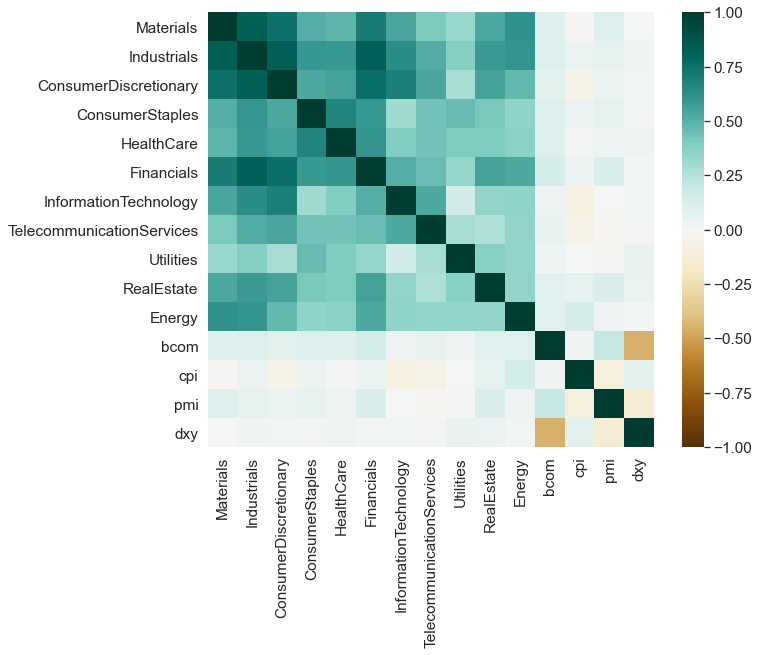

In [24]:
# create heatmap to visualize the correlation
plt.figure(figsize = (10,8))
sns.set(font_scale=1.4)
sns.heatmap(Full.corr(),vmin=-1, vmax=1,cmap='BrBG')
plt.show()

## Rolling Correlation --- S&P 500 Return vs. BCOM Change

In [25]:
# create empty data frame to store the correlation coefficient
Corr_table = pd.DataFrame()
# select column name of 11 sectors
cols       = Full.columns[:-4]
# Setting rolling window
window     = [6,12,36]

## Calculate the rolling correlation coefficient for each sector on three window sizes
# iterate through three window sizes
for w in window:
    # iterate through the 11 sectors
    for c in cols:
        X1 = Full[c]
        X2 = Full['bcom']
        # setting the column name using two variable names and the window size used
        Corr_table[c+'_Bcom_'+str(w)] = X2.rolling(w).corr(X1)
        

In [26]:
Corr_table.set_index(Full.index,inplace = True)
Corr_table

,Materials_Bcom_6,Industrials_Bcom_6,ConsumerDiscretionary_Bcom_6,ConsumerStaples_Bcom_6,HealthCare_Bcom_6,Financials_Bcom_6,InformationTechnology_Bcom_6,TelecommunicationServices_Bcom_6,Utilities_Bcom_6,RealEstate_Bcom_6,...,Industrials_Bcom_36,ConsumerDiscretionary_Bcom_36,ConsumerStaples_Bcom_36,HealthCare_Bcom_36,Financials_Bcom_36,InformationTechnology_Bcom_36,TelecommunicationServices_Bcom_36,Utilities_Bcom_36,RealEstate_Bcom_36,Energy_Bcom_36
Date,,,,,,,,,,,,,,,,,,,,,
1995-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1995-02-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1995-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1995-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1995-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31,0.372143,0.165561,0.518554,0.176202,0.372071,-0.209293,-0.139882,-0.401279,0.221486,0.454243,...,-0.063137,0.032116,-0.073354,-0.069648,-0.032601,-0.195690,-0.070621,0.061086,0.185036,-0.107830
2022-01-31,0.318965,0.132230,0.401494,0.101707,0.325294,-0.326057,-0.301697,-0.633064,0.128374,0.322683,...,-0.032774,0.009408,-0.074136,-0.081920,-0.035136,-0.192265,-0.102209,0.080899,0.164923,-0.099147
2022-02-28,0.532486,0.310200,0.497807,0.117616,0.504803,-0.299852,-0.545652,-0.816603,0.497064,0.513602,...,-0.004291,0.024157,-0.085377,-0.028452,-0.030082,-0.268491,-0.191853,0.153872,0.199021,-0.066444


### Visualization

In [27]:
new_cols = cols + '_Bcom_'
new_cols

Index(['Materials_Bcom_', 'Industrials_Bcom_', 'ConsumerDiscretionary_Bcom_',
       'ConsumerStaples_Bcom_', 'HealthCare_Bcom_', 'Financials_Bcom_',
       'InformationTechnology_Bcom_', 'TelecommunicationServices_Bcom_',
       'Utilities_Bcom_', 'RealEstate_Bcom_', 'Energy_Bcom_'],
      dtype='object')

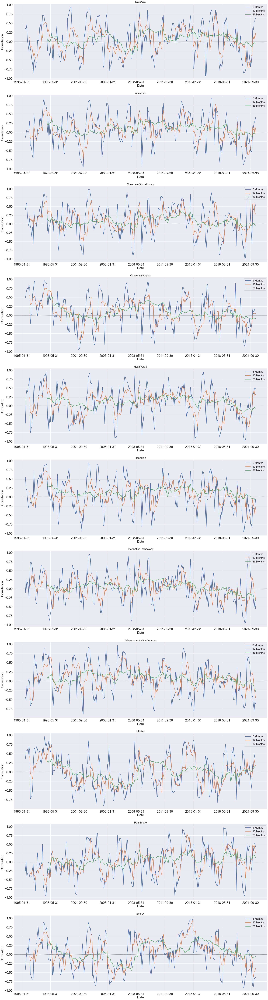

In [30]:
# setting figure size
plt.figure(figsize = (35,140))
for i in range(len(new_cols)):
    # setting spaces for 11 subplots (11 rows, 1 column)
    plt.subplot(11,1,i+1)
    plt.plot(Corr_table[new_cols[i]+str(6)], label = '6 Months',linewidth = 2.5)
    plt.plot(Corr_table[new_cols[i]+str(12)],label = '12 Months',linewidth = 2.5)
    plt.plot(Corr_table[new_cols[i]+str(36)],label = '36 Months',linewidth = 2.5)
    # setting xtick frequency
    plt.xticks(np.arange(0, len(Corr_table)+1, 40),fontsize = 25)
    plt.yticks(fontsize = 25)
    plt.title(cols[i],fontsize = 20)
    # reference line when corr = 0
    plt.axhline(y = 0,color='grey',linestyle='--')
    plt.legend(loc = 'upper right',fontsize = 20)
    plt.xlabel('Date',fontsize=25)
    plt.ylabel('Correlation',fontsize=25)


## SP500 Return vs. CPI Change

In [31]:
Corr_table5 = pd.DataFrame()
window      = [6,12,36]
for w in window:
    for c in cols:
        X1 = Full[c]
        X2 = Full['cpi']
        Corr_table5[c+'_CPI_'+str(w)] = X2.rolling(w).corr(X1)
Corr_table5.set_index(Full.index,inplace = True)

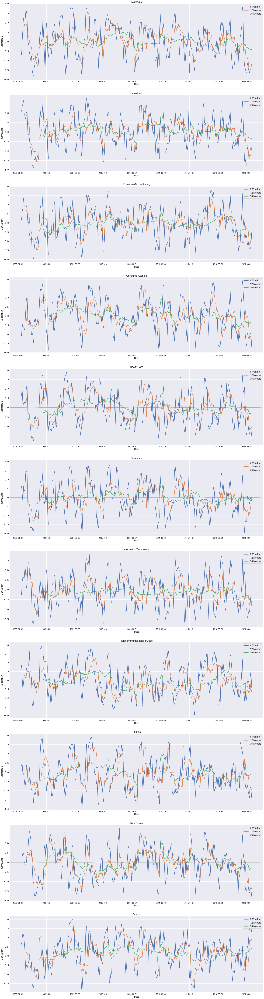

In [32]:
new_cols1 = cols + '_CPI_'

plt.figure(figsize = (35,140))
for i in range(len(new_cols1)):
    plt.subplot(11,1,i+1)
    plt.plot(Corr_table5[new_cols1[i]+str(6)],label = '6 Months',linewidth = 2.5)
    plt.plot(Corr_table5[new_cols1[i]+str(12)],label = '12 Months',linewidth = 2.5)
    plt.plot(Corr_table5[new_cols1[i]+str(36)],label = '36 Months',linewidth = 2.5)
    plt.xticks(np.arange(0, len(Corr_table5)+1, 40),fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.title(cols[i],fontsize = 20)
    plt.axhline(y = 0,color='grey',linestyle='--')
    plt.legend(loc = 'upper right',fontsize = 18)
    plt.xlabel('Date',fontsize=18)
    plt.ylabel('Correlation',fontsize=18)

## SP500 Return vs.PMI Change

In [33]:
Corr_table6 = pd.DataFrame()
window      = [6,12,36]
for w in window:
    for c in cols:
        X1 = Full[c]
        X2 = Full['pmi']
        Corr_table6[c+'_PMI_'+str(w)] = X2.rolling(w).corr(X1)
Corr_table6.set_index(Full.index,inplace = True)

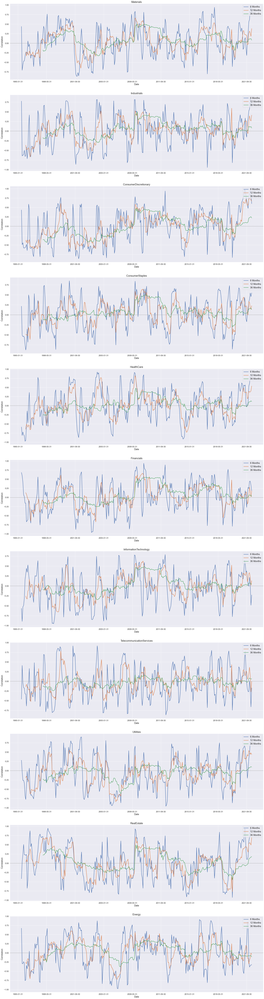

In [34]:
new_cols2 = cols + '_PMI_'

plt.figure(figsize = (35,140))
for i in range(len(new_cols2)):
    plt.subplot(11,1,i+1)
    plt.plot(Corr_table6[new_cols2[i]+str(6)],label  = '6 Months',linewidth = 2.5)
    plt.plot(Corr_table6[new_cols2[i]+str(12)],label = '12 Months',linewidth = 2.5)
    plt.plot(Corr_table6[new_cols2[i]+str(36)],label = '36 Months',linewidth = 2.5)
    plt.xticks(np.arange(0, len(Corr_table6)+1, 40),fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.title(cols[i],fontsize = 20)
    plt.axhline(y = 0,color='grey',linestyle='--')
    plt.legend(loc = 'upper right',fontsize = 18)
    plt.xlabel('Date',fontsize=18)
    plt.ylabel('Correlation',fontsize=18)

## SP500 Return vs. DXY Change

In [35]:
Corr_table7 = pd.DataFrame()
window      = [6,12,36]
for w in window:
    for c in cols:
        X1 = Full[c]
        X2 = Full['dxy']
        Corr_table7[c+'_DXY_'+str(w)] = X2.rolling(w).corr(X1)
Corr_table7.set_index(Full.index,inplace = True)

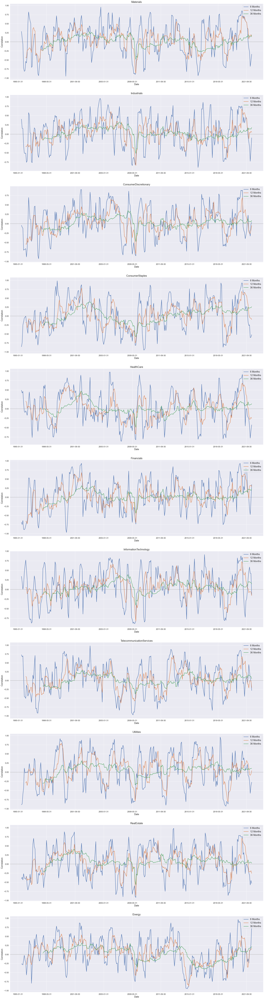

In [36]:
new_cols3 = cols + '_DXY_'

plt.figure(figsize = (35,140))
for i in range(len(new_cols3)):
    plt.subplot(11,1,i+1)
    plt.plot(Corr_table7[new_cols3[i]+str(6)],label = '6 Months',linewidth = 2.5)
    plt.plot(Corr_table7[new_cols3[i]+str(12)],label = '12 Months',linewidth = 2.5)
    plt.plot(Corr_table7[new_cols3[i]+str(36)],label = '36 Months',linewidth = 2.5)
    plt.xticks(np.arange(0, len(Corr_table6)+1, 40),fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.title(cols[i],fontsize = 20)
    plt.axhline(y = 0,color='grey',linestyle='--')
    plt.legend(loc = 'upper right',fontsize = 18)
    plt.xlabel('Date',fontsize=18)
    plt.ylabel('Correlation',fontsize=18)

## Rolling Correlation --- BCOM Change vs. CPI Change

In [37]:
Corr_table2 = pd.DataFrame()
for w in window:
    X1 = Full['bcom']
    X2 = Full['cpi']
    Corr_table2['Bcom_CPI_'+str(w)] = X2.rolling(w).corr(X1)
Corr_table2.set_index(Full.index,inplace = True)

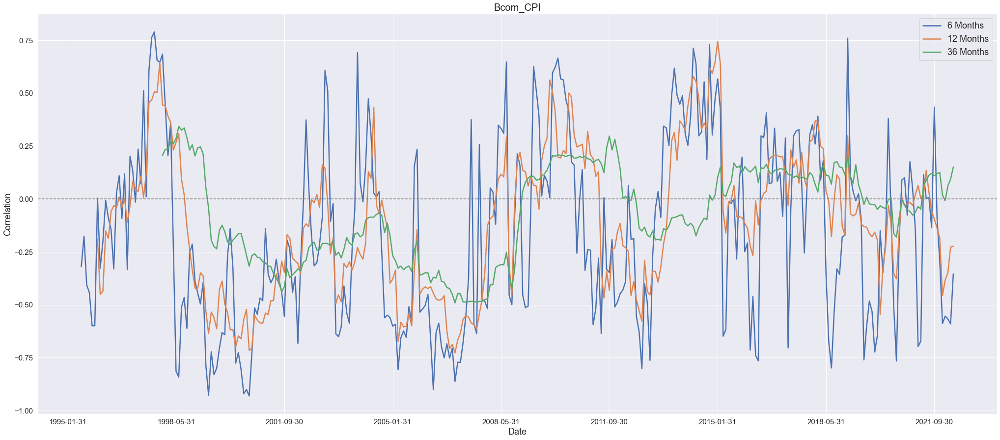

In [38]:
plt.figure(figsize = (35,15))
plt.plot(Corr_table2['Bcom_CPI_6'],label  = '6 Months',linewidth = 2.5)
plt.plot(Corr_table2['Bcom_CPI_12'],label = '12 Months',linewidth = 2.5)
plt.plot(Corr_table2['Bcom_CPI_36'],label = '36 Months',linewidth = 2.5)
plt.xticks(np.arange(0, len(Corr_table2)+1, 40),fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Bcom_CPI',fontsize = 20)
plt.axhline(y = 0,color='grey',linestyle='--')
plt.legend(loc = 'upper right',fontsize = 18)
plt.xlabel('Date',fontsize=18)
plt.ylabel('Correlation',fontsize=18)
plt.show()

## Rolling Correlation --- BCOM Change vs. PMI Change

In [39]:
Corr_table3 = pd.DataFrame()
for w in window:
    X1 = Full['bcom']
    X2 = Full['pmi']
    Corr_table3['Bcom_PMI_'+str(w)] = X2.rolling(w).corr(X1)
Corr_table3.set_index(Full.index,inplace = True)

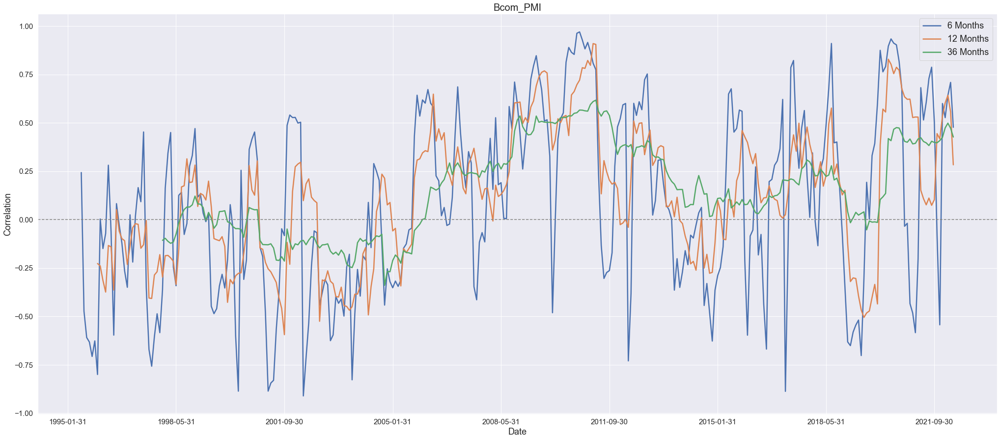

In [40]:
plt.figure(figsize = (35,15))
plt.plot(Corr_table3['Bcom_PMI_6'],label  = '6 Months',linewidth = 2.5)
plt.plot(Corr_table3['Bcom_PMI_12'],label = '12 Months',linewidth = 2.5)
plt.plot(Corr_table3['Bcom_PMI_36'],label = '36 Months',linewidth = 2.5)
plt.xticks(np.arange(0, len(Corr_table3)+1, 40),fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Bcom_PMI',fontsize = 20)
plt.axhline(y = 0,color='grey',linestyle='--')
plt.legend(loc = 'upper right',fontsize = 18)
plt.xlabel('Date',fontsize=18)
plt.ylabel('Correlation',fontsize=18)
plt.show()

## Rolling Correlation --- BCOM Change vs. DXY Change

In [41]:
Corr_table4 = pd.DataFrame()
for w in window:
    X1 = Full['bcom']
    X2 = Full['dxy']
    Corr_table4['Bcom_DXY_'+str(w)] = X2.rolling(w).corr(X1)
Corr_table4.set_index(Full.index,inplace = True)

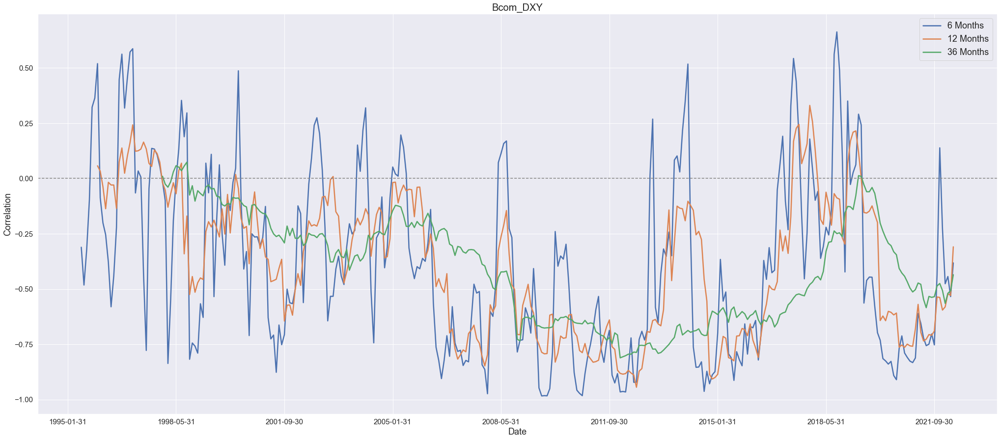

In [42]:
plt.figure(figsize = (35,15))
plt.plot(Corr_table4['Bcom_DXY_6'],label  = '6 Months',linewidth = 2.5)
plt.plot(Corr_table4['Bcom_DXY_12'],label = '12 Months',linewidth = 2.5)
plt.plot(Corr_table4['Bcom_DXY_36'],label = '36 Months',linewidth = 2.5)
plt.xticks(np.arange(0, len(Corr_table4)+1, 40),fontsize = 15)
plt.yticks(fontsize = 15)
plt.title('Bcom_DXY',fontsize = 20)
plt.axhline(y = 0,color='grey',linestyle='--')
plt.legend(loc = 'upper right',fontsize = 18)
plt.xlabel('Date',fontsize=18)
plt.ylabel('Correlation',fontsize=18)
plt.show()